# Image Similarity, Features and Retrieval

What is a similar images?
https://catriona-campbell.medium.com/doughnut-or-bagel-helping-ai-fill-a-hole-in-perception-f23d29c7838c

## What are image features




### prepare the data, once for WAID and once for the Iguana project
001_hasty_to_tile_data_prep.py

001_isaid_to_tile.py

In [1]:
%load_ext autoreload
%autoreload 2

In [35]:
from pathlib import Path

In [36]:
imgage_path_iguana = image_path_2 = Path(
    "/Users/christian/data/training_data/2025_02_22_HIT/01_segment_pretraining/segments_12/train/classification/iguana/Fer_FCD01-02-03_20122021_single_images___DJI_0366_x1344_y448.jpg")
image_path_empty_1 = Path(
    '/Users/christian/data/training_data/2025_02_22_HIT/01_segment_pretraining/segments_12/train/classification/empty/San_STJB06_12012023___STJB06_12012023_Santiago_m_2_7_DJI_0128_x2240_y2688.jpg')

image_root_dir = Path(
    "/Users/christian/data/training_data/2025_02_22_HIT/03_all_other/val/classification")
image_cats_and_dogs_root_dir = Path("/Users/christian/Downloads/kagglecatsanddogs_5340/PetImages224")

class_empty = "empty"
class_iguana = "iguana_point"
class_dog = "Dog"
class_cat = "Cat"

iguana_images = [i for i in image_root_dir.joinpath(class_iguana).glob("*.jpg") if not str(i.name).startswith(".")]
cat_images = [i for i in image_cats_and_dogs_root_dir.joinpath(class_cat).glob("*.jpg") if
              not str(i.name).startswith(".")]
dog_images = [i for i in image_cats_and_dogs_root_dir.joinpath(class_dog).glob("*.jpg") if
              not str(i.name).startswith(".")]
empty_images = [i for i in image_root_dir.joinpath(class_empty).glob("*.jpg") if not str(i.name).startswith(".")]

threshold = 20
iguana_images = iguana_images[:threshold]
dog_images = dog_images[:threshold]
cat_images = cat_images[:threshold]
empty_images = empty_images[:threshold]

Using device: mps


Calculating pairwise SSIM: 100%|██████████| 400/400 [00:02<00:00, 144.26it/s]


Results saved to pairwise_ssim_results.csv


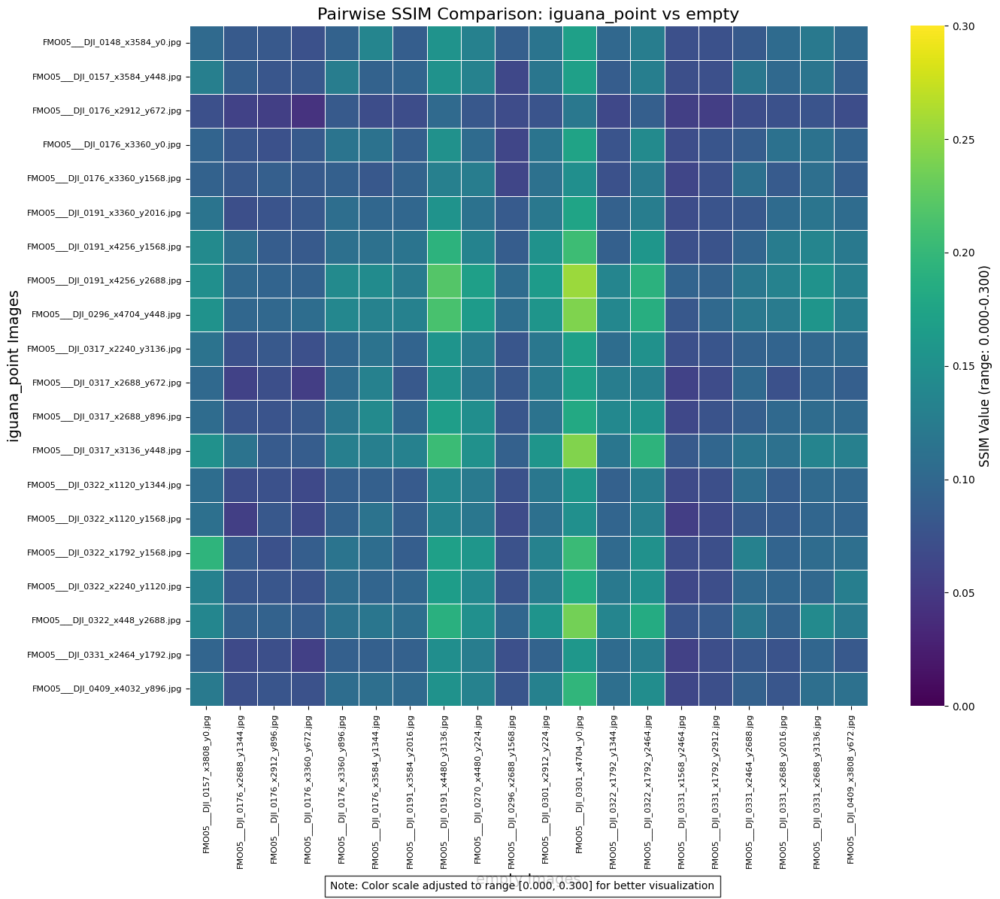

Average SSIM iguana_point vs empty: 0.1090


In [38]:
from active_learning.pipelines.similarity_measure import calculate_pairwise_ssim_cm

# Calculate pairwise SSIM and save results to CSV
results_df = calculate_pairwise_ssim_cm(
    images_class_a=iguana_images,
    images_class_b=empty_images,
    class_a=class_iguana,
    class_b=class_empty,
    output_csv="pairwise_ssim_results.csv",
    vmin=0.0,
    vmax=0.3,
)
# Basic average of all SSIM values
average_ssim = results_df['ssim'].mean()
print(f"Average SSIM {class_iguana} vs {class_empty}: {average_ssim:.4f}")

Using device: mps


Calculating pairwise SSIM: 100%|██████████| 400/400 [00:02<00:00, 143.34it/s]


Results saved to pairwise_ssim_results.csv


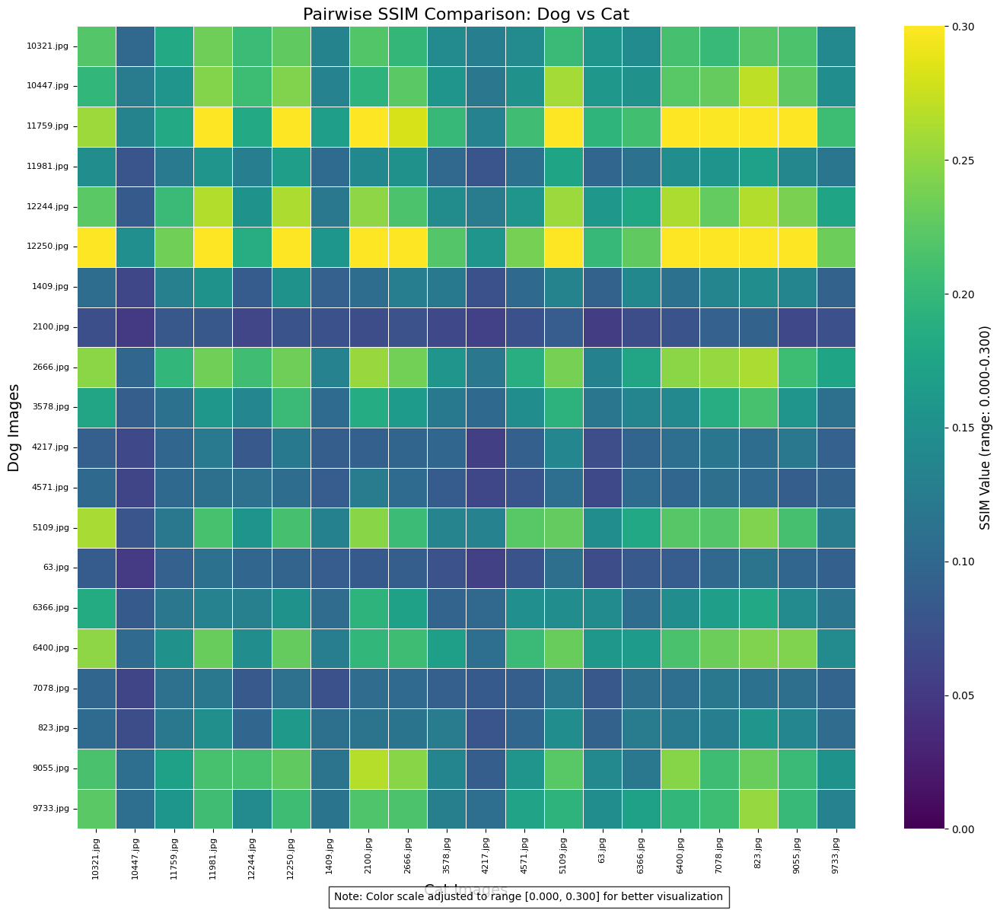

Average SSIM Dog vs Cat: 0.1559


In [39]:
# Calculate pairwise SSIM and save results to CSV
results_df = calculate_pairwise_ssim_cm(
    images_class_a=dog_images,
    images_class_b=cat_images,
    class_a=class_dog,
    class_b=class_cat,
    output_csv="pairwise_ssim_results.csv",
    vmin=0.0,
    vmax=0.3,
)
# Basic average of all SSIM values
average_ssim = results_df['ssim'].mean()
print(f"Average SSIM {class_dog} vs {class_cat}: {average_ssim:.4f}")

#

How to do Reliability Estimation

An Embedding is Worth a Thousand Noisy Labels [ arXiv:2408.14358v1 ]

In [2]:
from pathlib import Path
from active_learning.feature_extraction.timm_feature_extraction import FeatureExtractor


model_name = "timm/resnet34.a1_in1k"
extractor = FeatureExtractor(model_name)

# image_root_dir = "/Users/christian/data/WAID-main/WAID/images/train_sample"  # This should contain subfolders (ClassA, ClassB, ...)
image_root_dir = Path("/Users/christian/data/training_data/2025_02_22_HIT/01_segment_pretraining/segments_12/val/classification")  # This should contain subfolders (ClassA, ClassB, ...)
embedding_save_path = "embeddings_with_labels.csv"
tsne_embedding_save_path = "tsne_embeddings_with_labels.csv"

images_list = [i for i in image_root_dir.rglob("*.jpg") if not str(i).startswith(".")]
class_labels = [x.parent.stem for x in images_list]

df_features = extractor.extract_from_image_list(images_list, class_labels=class_labels, save_path=embedding_save_path)


Extracting features: 100%|██████████| 58/58 [00:01<00:00, 54.37it/s]

Saved embeddings to embeddings_with_labels.csv


In [3]:
df_features

,0,1,2,3,4,5,6,7,8,9,...,503,504,505,506,507,508,509,510,511,class
Fer_FCD01-02-03_20122021_single_images___DJI_0079_FCD01_x3584_y1120.jpg,0.000000,0.000777,0.000425,0.001363,0.297761,0.032656,1.075873e-02,0.032408,0.002603,0.001023,...,0.074530,0.000000,0.066335,0.109390,0.000989,0.000000,0.006631,0.031457,0.000000,empty
Fer_FCD01-02-03_20122021_single_images___DJI_0079_FCD01_x5152_y896.jpg,0.013506,0.000000,0.006829,0.017387,0.298347,0.001050,1.133073e-04,0.000384,0.020231,0.000000,...,0.000000,0.003616,0.011574,0.065170,0.001372,0.009979,0.019615,0.000000,0.050474,empty
Fer_FCD01-02-03_20122021_single_images___DJI_0079_FCD01_x4928_y1120.jpg,0.013251,0.004781,0.003776,0.005416,0.254821,0.000101,4.402267e-04,0.007553,0.104518,0.002660,...,0.000000,0.021478,0.078653,0.101717,0.004154,0.005119,0.002386,0.001042,0.010152,empty
Fer_FCD01-02-03_20122021_single_images___DJI_0079_FCD01_x5152_y2240.jpg,0.004271,0.003874,0.002244,0.041969,0.303236,0.000000,1.495372e-02,0.006001,0.034493,0.006718,...,0.000000,0.001012,0.022594,0.193798,0.000000,0.000335,0.010421,0.000000,0.019742,empty
Fer_FCD01-02-03_20122021_single_images___DJI_0079_FCD01_x3808_y896.jpg,0.000000,0.007715,0.017312,0.001212,0.440965,0.000000,0.000000e+00,0.002453,0.000000,0.001071,...,0.000000,0.006067,0.011776,0.215363,0.000000,0.000056,0.035601,0.000000,0.003071,empty
Fer_FCD01-02-03_20122021_single_images___DJI_0079_FCD01_x5152_y448.jpg,0.015123,0.026863,0.005718,0.049743,0.172767,0.000000,0.000000e+00,0.002495,0.035047,0.018477,...,0.003400,0.032985,0.022652,0.058684,0.027990,0.017497,0.056243,0.000000,0.016088,empty
Fer_FCD01-02-03_20122021_single_images___DJI_0079_FCD01_x4032_y896.jpg,0.001314,0.003214,0.002281,0.020148,0.252291,0.005520,2.054912e-02,0.014262,0.081546,0.003715,...,0.023365,0.023178,0.080486,0.131984,0.000000,0.000000,0.017026,0.003432,0.055501,empty
Fer_FCD01-02-03_20122021_single_images___DJI_0079_FCD01_x4480_y2016.jpg,0.007397,0.000000,0.000000,0.006581,0.352808,0.000000,8.825879e-04,0.034472,0.093533,0.017457,...,0.000000,0.000360,0.026265,0.285913,0.000000,0.000000,0.021676,0.000000,0.020216,empty
Fer_FCD01-02-03_20122021_single_images___DJI_0079_FCD01_x4928_y2016.jpg,0.052889,0.000000,0.000000,0.019628,0.340833,0.001758,2.202241e-02,0.000000,0.051163,0.001910,...,0.004851,0.000034,0.054741,0.176215,0.000000,0.005697,0.035777,0.003815,0.007944,empty
Fer_FCD01-02-03_20122021_single_images___DJI_0079_FCD01_x4256_y2016.jpg,0.019234,0.002222,0.000754,0.040594,0.298834,0.000000,5.211178e-05,0.008103,0.051531,0.016384,...,0.002604,0.000000,0.030056,0.179726,0.000000,0.000000,0.004898,0.000000,0.006442,empty


Reduce the hight dimensionality of the features into two dimensions

Applying t-SNE with perplexity=30...


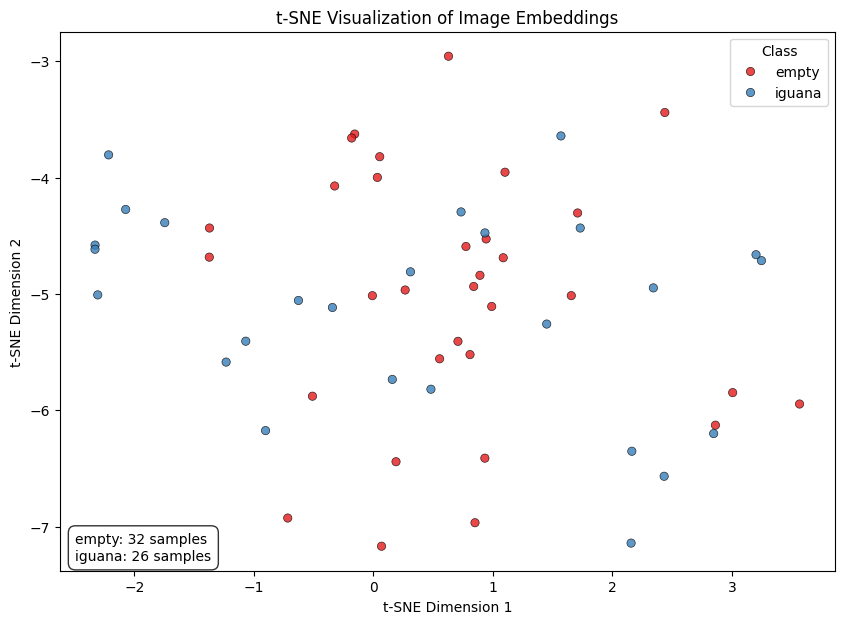

In [4]:
from active_learning.feature_extraction.embedding_clustering import get_tsn_embeddings

df_tsne_embeddings = get_tsn_embeddings(embedding_save_path)

df_tsne_embeddings.to_csv(tsne_embedding_save_path)

In [5]:
df_tsne_embeddings

,X,Y,class,file_name
0,3.566548,-5.945512,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...
1,0.190256,-6.441497,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...
2,0.933610,-6.411030,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...
3,0.840268,-4.935168,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...
4,0.053818,-3.819396,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...
5,0.069131,-7.167977,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...
6,3.006858,-5.847309,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...
7,1.656827,-5.013772,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...
8,-1.371985,-4.682965,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...
9,1.087353,-4.688052,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...


In [6]:
from active_learning.feature_extraction.embedding_clustering import visualize_clusters, perform_clustering

perform_clustering(df_tsne_embeddings, n_clusters=2)

df_tsne_embeddings

Applying K-means clustering with 2 clusters...


,X,Y,class,file_name,cluster,predicted_class,is_correct,cluster_confidence
0,3.566548,-5.945512,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...,1,empty,True,0.606061
1,0.190256,-6.441497,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...,1,empty,True,0.606061
2,0.933610,-6.411030,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...,1,empty,True,0.606061
3,0.840268,-4.935168,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...,1,empty,True,0.606061
4,0.053818,-3.819396,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...,0,iguana,False,0.520000
5,0.069131,-7.167977,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...,1,empty,True,0.606061
6,3.006858,-5.847309,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...,1,empty,True,0.606061
7,1.656827,-5.013772,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...,1,empty,True,0.606061
8,-1.371985,-4.682965,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...,0,iguana,False,0.520000
9,1.087353,-4.688052,empty,Fer_FCD01-02-03_20122021_single_images___DJI_0...,1,empty,True,0.606061


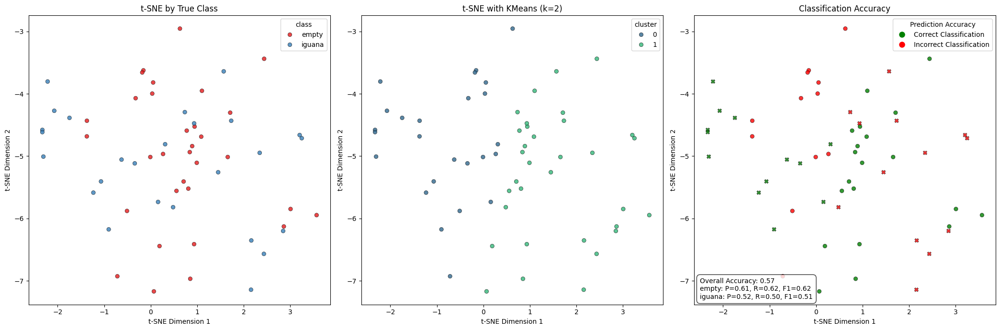

In [7]:

visualize_clusters(df_tsne_embeddings)

In [8]:
from active_learning.feature_extraction.embedding_clustering import get_misclassified_items

### What is the error now?
df_misclassified = get_misclassified_items(df_tsne_embeddings)

df_misclassified

,true_class,predicted_class,cluster,cluster_confidence,X,Y,file_name
4,empty,iguana,0,0.520000,0.053818,-3.819396,Fer_FCD01-02-03_20122021_single_images___DJI_0...
31,empty,iguana,0,0.520000,-0.007380,-5.014025,Fer_FCD01-02-03_20122021_single_images___DJI_0...
30,empty,iguana,0,0.520000,-1.370349,-4.432537,Fer_FCD01-02-03_20122021_single_images___DJI_0...
27,empty,iguana,0,0.520000,-0.508755,-5.878242,Fer_FCD01-02-03_20122021_single_images___DJI_0...
24,empty,iguana,0,0.520000,-0.180963,-3.658682,Fer_FCD01-02-03_20122021_single_images___DJI_0...
19,empty,iguana,0,0.520000,0.629422,-2.955646,Fer_FCD01-02-03_20122021_single_images___DJI_0...
26,empty,iguana,0,0.520000,-0.715825,-6.925636,Fer_FCD01-02-03_20122021_single_images___DJI_0...
15,empty,iguana,0,0.520000,-0.323235,-4.071170,Fer_FCD01-02-03_20122021_single_images___DJI_0...
14,empty,iguana,0,0.520000,-0.155613,-3.624684,Fer_FCD01-02-03_20122021_single_images___DJI_0...
13,empty,iguana,0,0.520000,0.266706,-4.965367,Fer_FCD01-02-03_20122021_single_images___DJI_0...


## Display those incorrect images


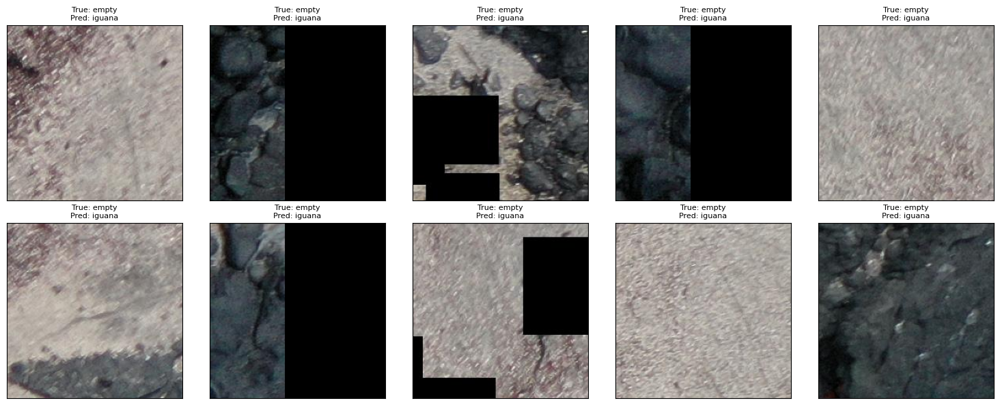

In [9]:

from active_learning.feature_extraction.embedding_clustering import display_misclassified_grid

display_misclassified_grid(df_misclassified[df_misclassified.true_class == "empty"], image_dir=image_root_dir, cols=5, rows=2, figsize=(15, 6))

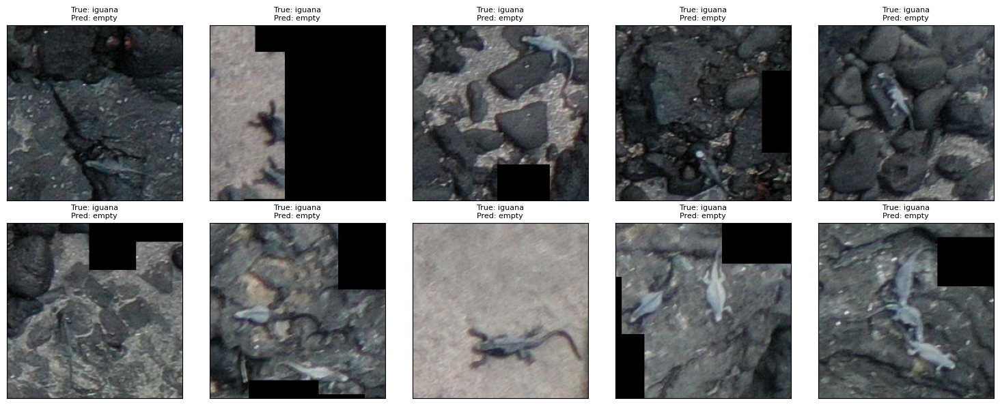

In [10]:
display_misclassified_grid(df_misclassified[df_misclassified.true_class == "iguana"], image_dir=image_root_dir, cols=5, rows=2, figsize=(15, 6))


Diagnosis:
- There are label errors in the data whith images labeled as empty, but they contain animals
- a pretrained resnet model can't seperate occupied from empty images

# Cats and Dogs
Is something wrong with the embeddings?

In [11]:

extractor = FeatureExtractor(model_name)

image_root_dir = Path("/Users/christian/Downloads/kagglecatsanddogs_5340/PetImages224")  # This should contain subfolders (ClassA, ClassB, ...)
embedding_save_path = "embeddings_with_labels_cats_dogs.csv"

images_list = [i for i in image_root_dir.rglob("*.jpg") if not str(i).startswith(".")]


import random

random.shuffle(images_list)
# create a sample subset
images_list = images_list[:1000]
class_labels = [x.parent.stem for x in images_list]

extractor.extract_from_image_list(images_list, class_labels=class_labels, save_path=embedding_save_path)

Extracting features: 100%|██████████| 1000/1000 [00:19<00:00, 51.81it/s]


Saved embeddings to embeddings_with_labels_cats_dogs.csv


,0,1,2,3,4,5,6,7,8,9,...,503,504,505,506,507,508,509,510,511,class
8258.jpg,0.005613,0.000000,0.001316,0.002039,0.254774,0.108143,0.016572,0.001588,0.000000,0.003010,...,0.046394,0.127900,0.000000,0.020806,0.045652,0.021778,0.150227,0.007838,0.003547,Dog
763.jpg,0.016712,0.002494,0.007903,0.048474,0.060017,0.081096,0.027353,0.048825,0.162041,0.004234,...,0.030925,0.020462,0.012812,0.038483,0.005045,0.034209,0.095183,0.054890,0.027361,Cat
9947.jpg,0.010844,0.000111,0.042382,0.016088,0.109762,0.064506,0.002528,0.031699,0.016812,0.015615,...,0.025554,0.003960,0.003688,0.007305,0.041397,0.014133,0.133572,0.002709,0.013582,Dog
7242.jpg,0.000000,0.000608,0.000000,0.017592,0.199115,0.039221,0.018756,0.012350,0.119895,0.022329,...,0.072616,0.038847,0.003911,0.112692,0.019009,0.014425,0.025658,0.042416,0.011834,Cat
6174.jpg,0.122652,0.000000,0.021238,0.000000,0.266676,0.005269,0.000000,0.015070,0.028106,0.000214,...,0.001373,0.007287,0.005978,0.024741,0.008271,0.033449,0.035641,0.021540,0.005501,Dog
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10245.jpg,0.000906,0.000000,0.000000,0.001534,0.266242,0.000161,0.040696,0.017293,0.137221,0.000000,...,0.129979,0.002313,0.000000,0.094827,0.013128,0.001357,0.024575,0.003695,0.019473,Cat
8411.jpg,0.008342,0.003771,0.008398,0.061552,0.115746,0.023833,0.052398,0.030415,0.117935,0.012253,...,0.062357,0.020918,0.005432,0.078021,0.000908,0.004547,0.033355,0.066585,0.013042,Cat
11494.jpg,0.028197,0.000343,0.006997,0.004719,0.175514,0.083020,0.009378,0.019547,0.075432,0.037330,...,0.049459,0.033536,0.005953,0.048589,0.065600,0.027821,0.038711,0.081464,0.002409,Dog
9669.jpg,0.008576,0.000612,0.000000,0.005147,0.086961,0.091794,0.015644,0.018777,0.110172,0.037778,...,0.049236,0.003398,0.009102,0.070126,0.002402,0.012115,0.097561,0.099630,0.018196,Cat


Applying t-SNE with perplexity=30...


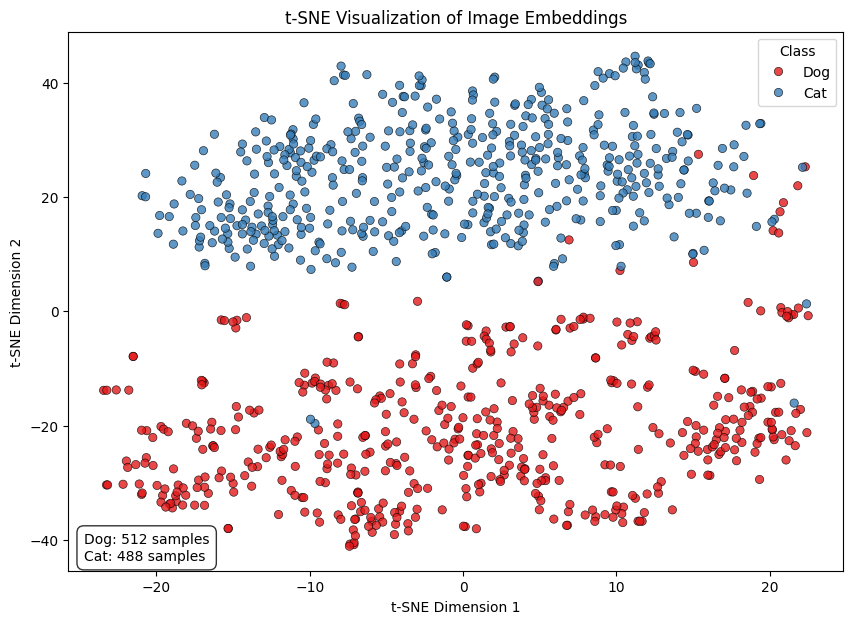

In [12]:
df_tsne_embeddings_cats_dogs = get_tsn_embeddings(embedding_save_path)

In [13]:
perform_clustering(df_tsne_embeddings_cats_dogs, n_clusters=2)

df_tsne_embeddings_cats_dogs

Applying K-means clustering with 2 clusters...


,X,Y,class,file_name,cluster,predicted_class,is_correct,cluster_confidence
0,18.707764,-16.651705,Dog,8258.jpg,1,Dog,True,0.993976
1,-3.433680,29.401306,Cat,763.jpg,0,Cat,True,0.966135
2,12.383725,-20.331104,Dog,9947.jpg,1,Dog,True,0.993976
3,-7.892204,14.053756,Cat,7242.jpg,0,Cat,True,0.966135
4,-5.425694,-14.804873,Dog,6174.jpg,1,Dog,True,0.993976
...,...,...,...,...,...,...,...,...
995,-13.834113,13.928832,Cat,10245.jpg,0,Cat,True,0.966135
996,-4.113648,31.390068,Cat,8411.jpg,0,Cat,True,0.966135
997,0.513920,-15.002351,Dog,11494.jpg,1,Dog,True,0.993976
998,-2.866317,41.147461,Cat,9669.jpg,0,Cat,True,0.966135


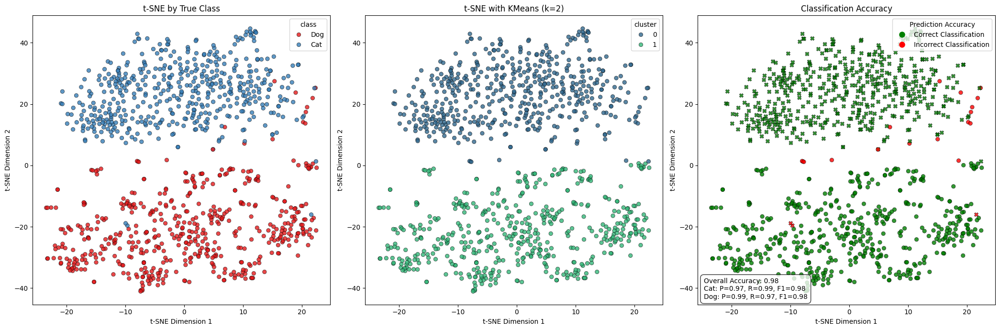

In [14]:
visualize_clusters(df_tsne_embeddings_cats_dogs)

In [15]:
# Get embeddings
df_misclassified_cats_dogs = get_misclassified_items(df_tsne_embeddings_cats_dogs)

df_misclassified_cats_dogs

,true_class,predicted_class,cluster,cluster_confidence,X,Y,file_name
73,Dog,Cat,0,0.966135,18.589382,1.547224,9391.jpg
879,Dog,Cat,0,0.966135,15.027352,8.544264,4595.jpg
876,Dog,Cat,0,0.966135,20.585558,13.694246,10908.jpg
863,Dog,Cat,0,0.966135,15.350959,27.443987,5534.jpg
852,Dog,Cat,0,0.966135,21.829250,21.947063,11297.jpg
788,Dog,Cat,0,0.966135,4.884330,5.188578,10461.jpg
765,Dog,Cat,0,0.966135,20.893490,18.993267,2146.jpg
925,Dog,Cat,0,0.966135,20.671375,17.401604,10401.jpg
635,Dog,Cat,0,0.966135,-7.718052,1.153998,1518.jpg
340,Dog,Cat,0,0.966135,-8.008022,1.392033,9736.jpg


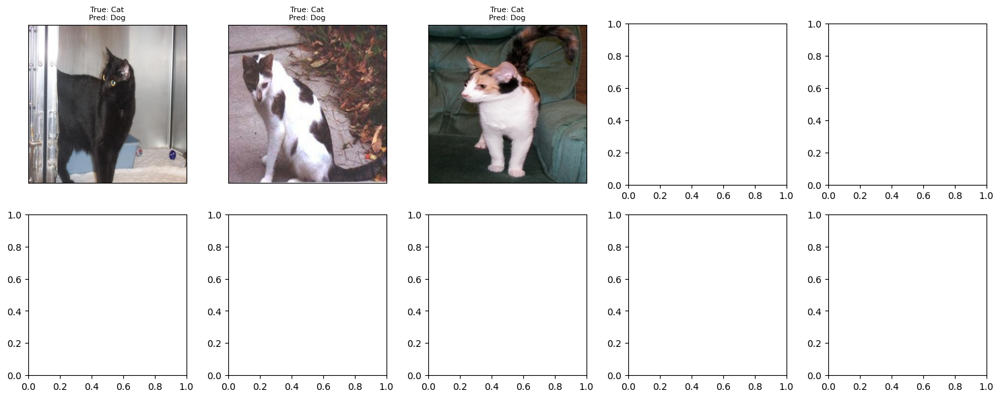

In [16]:
display_misclassified_grid(df_misclassified_cats_dogs[df_misclassified_cats_dogs.true_class == "Cat"], image_dir=image_root_dir, cols=5, rows=2, figsize=(15, 6))


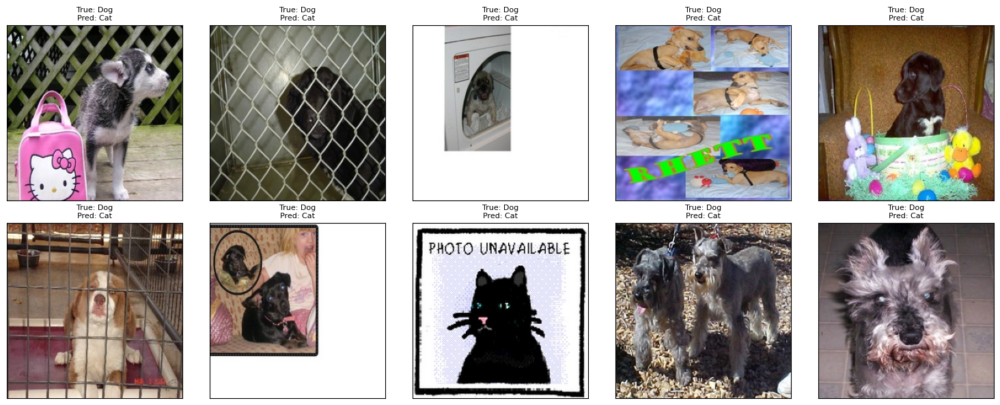

In [17]:
# Visualize
display_misclassified_grid(df_misclassified_cats_dogs[df_misclassified_cats_dogs.true_class == "Dog"], image_dir=image_root_dir, cols=5, rows=2, figsize=(15, 6))




## FIne tune on iguanas

Using device: mps
Creating model: timm/resnet34.a1_in1k with 2 classes
Trainable parameters: 1,026 / 21,285,698 (0.00%)


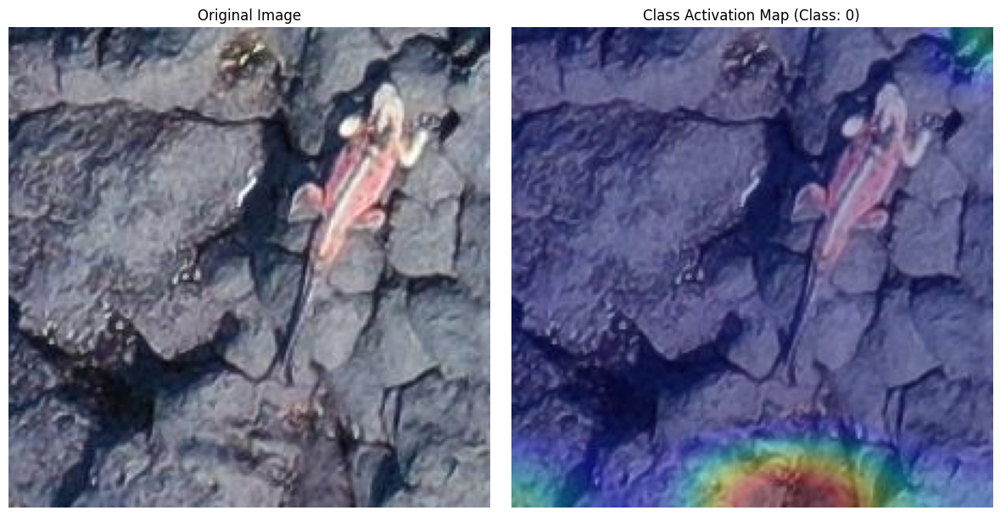

(array([[[ 26,  34,  53],
         [ 14,  22,  41],
         [ 24,  32,  51],
         ...,
         [ 31,  48,  68],
         [ 18,  33,  56],
         [ 18,  30,  54]],
 
        [[ 47,  55,  74],
         [ 31,  39,  58],
         [ 35,  43,  62],
         ...,
         [ 30,  47,  67],
         [ 23,  35,  59],
         [ 19,  31,  55]],
 
        [[ 62,  70,  89],
         [ 42,  50,  69],
         [ 41,  49,  68],
         ...,
         [ 27,  42,  63],
         [ 23,  35,  57],
         [ 18,  29,  51]],
 
        ...,
 
        [[124, 118, 130],
         [110, 107, 118],
         [103,  99, 113],
         ...,
         [122, 126, 137],
         [136, 140, 152],
         [156, 160, 171]],
 
        [[109, 101, 112],
         [ 91,  85,  95],
         [102,  96, 108],
         ...,
         [131, 135, 147],
         [141, 144, 159],
         [151, 155, 167]],
 
        [[106,  98, 109],
         [ 87,  79,  90],
         [110, 104, 116],
         ...,
         [139, 142, 157],
  

In [18]:
from active_learning.pipelines.fine_tune import ModelFineTuner

fine_tuner = ModelFineTuner(
    model_name="timm/resnet34.a1_in1k",  # Use any timm model
    num_classes=2,  # Number of your classes
    freeze_base=True,  # Start with frozen base for transfer learning
    device="mps"
)

fine_tuner.get_class_activation_map(Path("/Users/christian/data/training_data/2025_02_22_HIT/01_segment_pretraining/segments_12/train/classification/iguana/Floreana_02.02.21_FMO01___DJI_0942_x1344_y2240.jpg"))


## Try Fine Tuning the models


In [19]:
# TODO this does not work in a notebook, see the fine_tune.py script
# from pathlib import Path
#
#
# train_dir = Path("/Users/christian/data/training_data/2025_02_22_HIT/01_segment_pretraining/segments_12/train/classification") # TODO this val is just for debugging
# val_dir = Path("/Users/christian/data/training_data/2025_02_22_HIT/01_segment_pretraining/segments_12/val/classification")
#
# final_model_path = "/Users/christian/PycharmProjects/hnee/active_learning/active_learning/pipelines/final_model.pth"
# # Or specify separate validation directory
# fine_tuner.prepare_data(
#     train_dir=train_dir,
#     val_dir=val_dir,
#     batch_size=5
# )
#
#
# # Train with frozen base first
# fine_tuner.train(
#     epochs=3,
#     learning_rate=3e-4,
#     save_path="model_stage1.pth"
# )
#
# # Unfreeze layers for fine-tuning
# fine_tuner.unfreeze()
#
# # Continue training with lower learning rate
# fine_tuner.train(
#     epochs=3,
#     learning_rate=1e-4,
#     save_path=final_model_path,
#     early_stopping_patience=3
# )
#
# # Evaluate the model
# results = fine_tuner.evaluate(detailed=True)
#
# # Plot training history
# fine_tuner.plot_training_history()
#
# # Save the final model
# fine_tuner.save_model(final_model_path)

Loading training data from directory: /Users/christian/data/training_data/2025_02_22_HIT/01_segment_pretraining/segments_12/train/classification
Found 2 classes: empty, iguana
  - empty: 103 images
  - iguana: 99 images
Loaded 202 training images
Loading validation data from directory: /Users/christian/data/training_data/2025_02_22_HIT/01_segment_pretraining/segments_12/val/classification
Found 2 classes: empty, iguana
  - empty: 32 images
  - iguana: 26 images
Loaded 58 validation images


Epoch 1/3:   0%|          | 0/41 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 1/3 - 28.9s - Train Loss: 0.7141 - Val Loss: 0.7043 - Val Acc: 0.4138


AttributeError: Can't pickle local object 'ModelFineTuner.get_class_activation_map.<locals>.hook_fn'

Using device: mps
Loading checkpoint from /Users/christian/PycharmProjects/hnee/active_learning/active_learning/pipelines/final_model.pth
Trainable parameters: 1,026 / 21,285,698 (0.00%)


/Users/christian/PycharmProjects/hnee/active_learning/active_learning/pipelines/fine_tune.py:90: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.model = torch.load(checkp

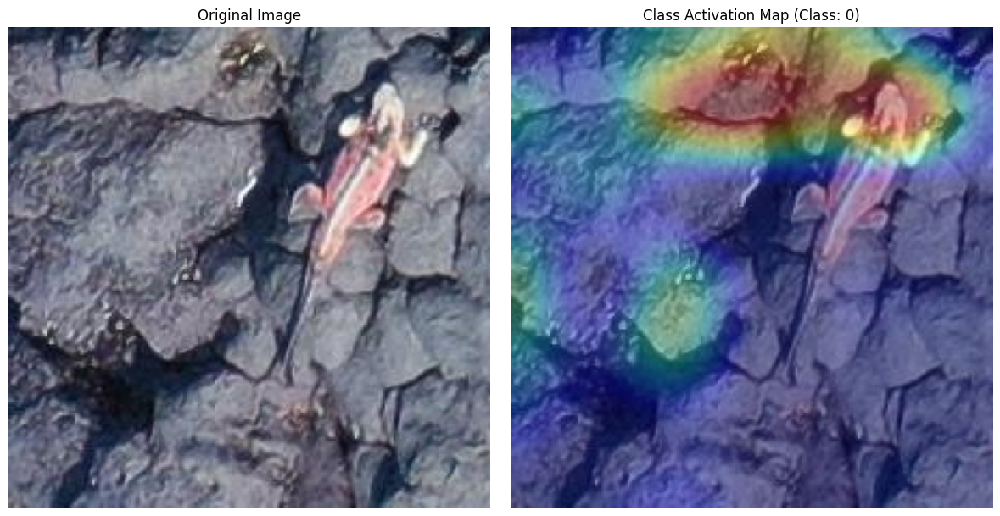

(array([[[ 26,  34,  53],
         [ 14,  22,  41],
         [ 24,  32,  51],
         ...,
         [ 31,  48,  68],
         [ 18,  33,  56],
         [ 18,  30,  54]],
 
        [[ 47,  55,  74],
         [ 31,  39,  58],
         [ 35,  43,  62],
         ...,
         [ 30,  47,  67],
         [ 23,  35,  59],
         [ 19,  31,  55]],
 
        [[ 62,  70,  89],
         [ 42,  50,  69],
         [ 41,  49,  68],
         ...,
         [ 27,  42,  63],
         [ 23,  35,  57],
         [ 18,  29,  51]],
 
        ...,
 
        [[124, 118, 130],
         [110, 107, 118],
         [103,  99, 113],
         ...,
         [122, 126, 137],
         [136, 140, 152],
         [156, 160, 171]],
 
        [[109, 101, 112],
         [ 91,  85,  95],
         [102,  96, 108],
         ...,
         [131, 135, 147],
         [141, 144, 159],
         [151, 155, 167]],
 
        [[106,  98, 109],
         [ 87,  79,  90],
         [110, 104, 116],
         ...,
         [139, 142, 157],
  

In [21]:
fine_tuner = ModelFineTuner(
    model_name="timm/resnet34.a1_in1k",  # Use any timm model
    num_classes=2,  # Number of your classes
    freeze_base=True,  # Start with frozen base for transfer learning
    device="mps",
    checkpoint_path="/Users/christian/PycharmProjects/hnee/active_learning/active_learning/pipelines/final_model.pth"
)

fine_tuner.get_class_activation_map(Path("/Users/christian/data/training_data/2025_02_22_HIT/01_segment_pretraining/segments_12/train/classification/iguana/Floreana_02.02.21_FMO01___DJI_0942_x1344_y2240.jpg"))

Using device: mps
Loading checkpoint from /Users/christian/PycharmProjects/hnee/active_learning/active_learning/pipelines/model_final.pth
Trainable parameters: 1,026 / 21,285,698 (0.00%)


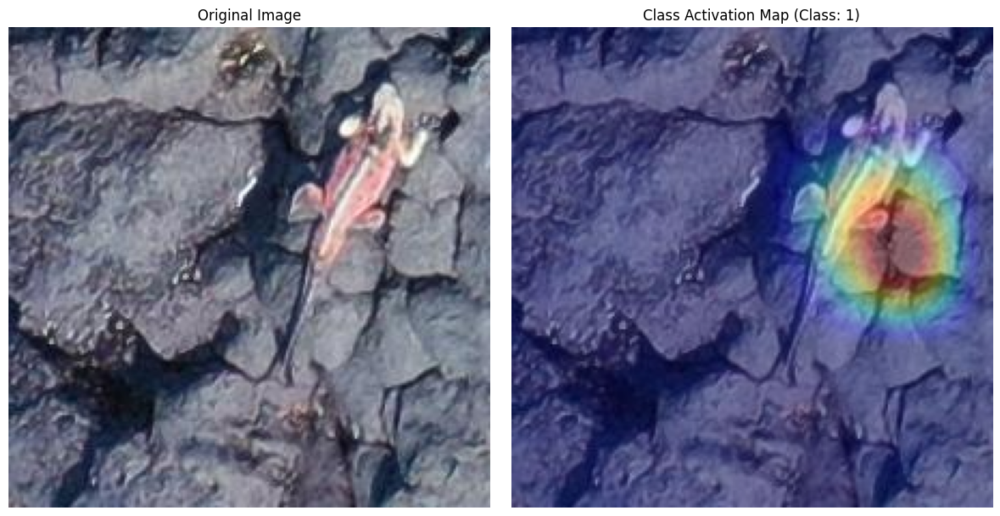

(array([[[ 26,  34,  53],
         [ 14,  22,  41],
         [ 24,  32,  51],
         ...,
         [ 31,  48,  68],
         [ 18,  33,  56],
         [ 18,  30,  54]],
 
        [[ 47,  55,  74],
         [ 31,  39,  58],
         [ 35,  43,  62],
         ...,
         [ 30,  47,  67],
         [ 23,  35,  59],
         [ 19,  31,  55]],
 
        [[ 62,  70,  89],
         [ 42,  50,  69],
         [ 41,  49,  68],
         ...,
         [ 27,  42,  63],
         [ 23,  35,  57],
         [ 18,  29,  51]],
 
        ...,
 
        [[124, 118, 130],
         [110, 107, 118],
         [103,  99, 113],
         ...,
         [122, 126, 137],
         [136, 140, 152],
         [156, 160, 171]],
 
        [[109, 101, 112],
         [ 91,  85,  95],
         [102,  96, 108],
         ...,
         [131, 135, 147],
         [141, 144, 159],
         [151, 155, 167]],
 
        [[106,  98, 109],
         [ 87,  79,  90],
         [110, 104, 116],
         ...,
         [139, 142, 157],
  

In [22]:

model_path = Path("/Users/christian/PycharmProjects/hnee/active_learning/active_learning/pipelines/model_final.pth")
image_path =  Path("/Users/christian/data/training_data/2025_02_22_HIT/01_segment_pretraining/segments_12/train/classification/iguana/Floreana_02.02.21_FMO01___DJI_0942_x1344_y2240.jpg")
final_model_path = "/Users/christian/PycharmProjects/hnee/active_learning/active_learning/pipelines/final_model.pth"

fine_tuner = ModelFineTuner(
        model_name=final_model_path,  # Use any timm model
        num_classes=2,  # Number of your classes
        freeze_base=True,  # Start with frozen base for transfer learning
        device="mps",
        checkpoint_path=model_path
    )


fine_tuner.get_class_activation_map(image_path)

In [23]:
from active_learning.pipelines.inference import ModelInference

inference = ModelInference.from_saved_model(model_path, class_map={"empty": 1, "iguana": 0})

inference.predict_single(image_path)

Using device: mps
Loading model from /Users/christian/PycharmProjects/hnee/active_learning/active_learning/pipelines/model_final.pth
Using class mapping with 2 classes


/Users/christian/PycharmProjects/hnee/active_learning/active_learning/pipelines/inference.py:54: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.model = torch.load(model_

'empty'

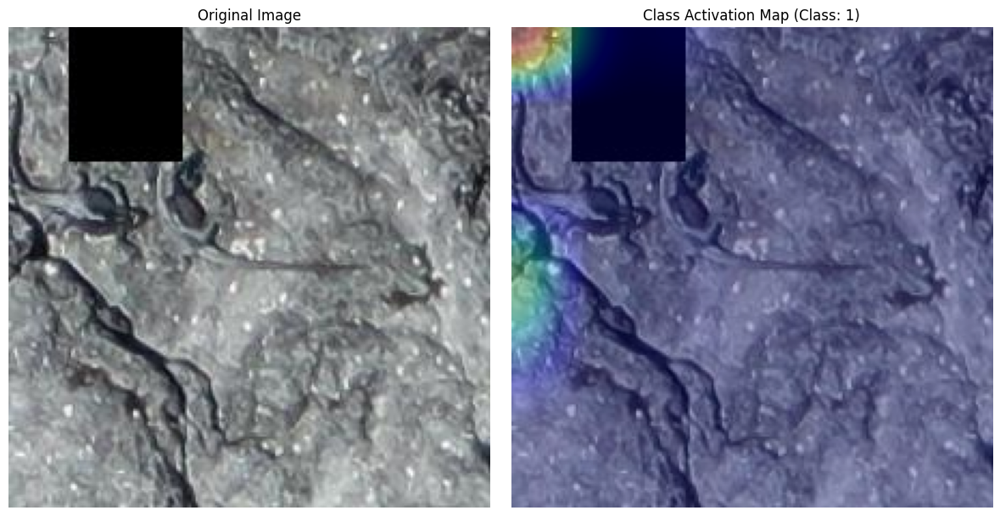

'empty'

In [24]:
image_path_2 = Path("/Users/christian/data/training_data/2025_02_22_HIT/01_segment_pretraining/segments_12/train/classification/iguana/Fer_FCD01-02-03_20122021_single_images___DJI_0366_x1344_y448.jpg")
fine_tuner.get_class_activation_map(image_path_2)
inference.predict_single(image_path_2)

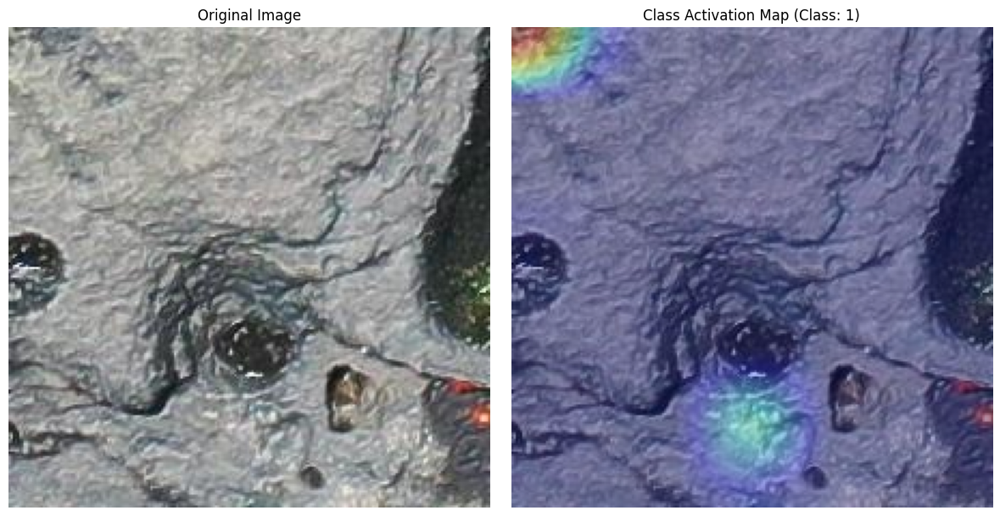

'empty'

In [25]:
image_path_empty_1 = Path('/Users/christian/data/training_data/2025_02_22_HIT/01_segment_pretraining/segments_12/train/classification/empty/San_STJB06_12012023___STJB06_12012023_Santiago_m_2_7_DJI_0128_x2240_y2688.jpg')
fine_tuner.get_class_activation_map(image_path_empty_1)
inference.predict_single(image_path_empty_1)


## Fine Tune with Cats and Dogs

In [26]:
from active_learning.pipelines.data_splitting import split_dataset

split_dataset(
    source_dir=Path("/Users/christian/Downloads/kagglecatsanddogs_5340/PetImages224"),
    output_dir=Path("/Users/christian/Downloads/kagglecatsanddogs_5340/PetImages224_train_val"),
    train_ratio=0.9,
    copy_files=True,
    random_seed=42,
    max_samples_per_class=100,

)

Found 2 classes: Cat, Dog
Processing class: Cat
  Limiting to 100 samples for class Cat
  Copying 90 files to training set


  Train Cat: 100%|████████████████████████████| 90/90 [00:00<00:00, 1838.42it/s]


  Copying 10 files to validation set


  Val Cat: 100%|██████████████████████████████| 10/10 [00:00<00:00, 1359.98it/s]

Processing class: Dog


  Limiting to 100 samples for class Dog
  Copying 90 files to training set


  Train Dog: 100%|████████████████████████████| 90/90 [00:00<00:00, 2070.64it/s]


  Copying 10 files to validation set


  Val Dog: 100%|██████████████████████████████| 10/10 [00:00<00:00, 1510.81it/s]


Split complete:
  Training set: 180 images
  Validation set: 20 images
  Train/val ratio: 0.90/0.10
  Training data: /Users/christian/Downloads/kagglecatsanddogs_5340/PetImages224_train_val/train
  Validation data: /Users/christian/Downloads/kagglecatsanddogs_5340/PetImages224_train_val/val


(180, 20)

### After Fine Tuning on cats and dogs

In [27]:
model_path = "/Users/christian/PycharmProjects/hnee/active_learning/active_learning/pipelines/final_model_cats_docs.pth"

/Users/christian/PycharmProjects/hnee/active_learning/active_learning/feature_extraction/timm_feature_extraction.py:29: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.mo

Saved embeddings to embeddings_with_labels_cats_dogs.csv
Applying t-SNE with perplexity=40...


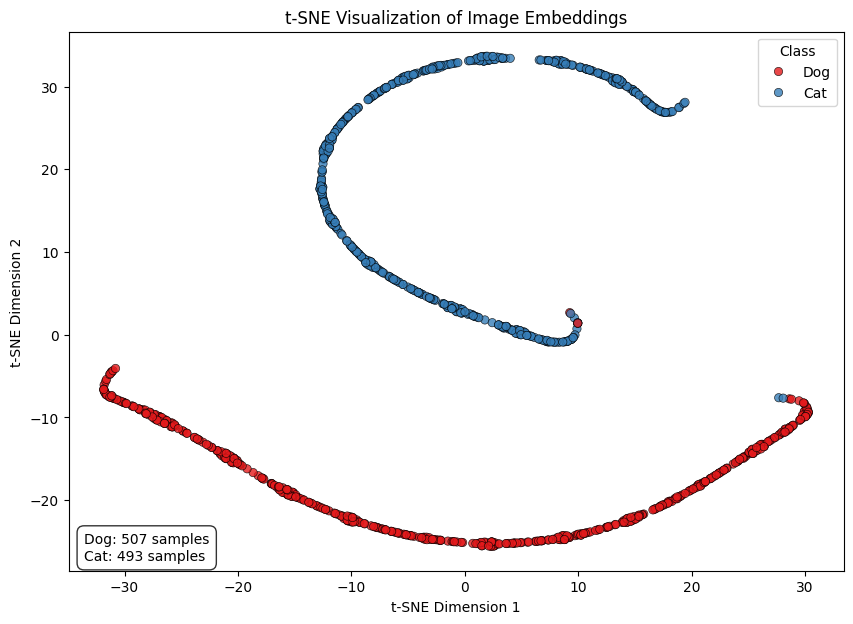

In [28]:
extractor = FeatureExtractor(model_path=model_path)

image_root_dir = Path("/Users/christian/Downloads/kagglecatsanddogs_5340/PetImages224")  # This should contain subfolders (ClassA, ClassB, ...)
embedding_save_path = "embeddings_with_labels_cats_dogs.csv"

images_list = [i for i in image_root_dir.rglob("*.jpg") if not str(i).startswith(".")]


import random

random.shuffle(images_list)
# create a sample subset
images_list = images_list[:1000]
class_labels = [x.parent.stem for x in images_list]

extractor.extract_from_image_list(images_list, class_labels=class_labels, save_path=embedding_save_path)
df_tsne_embeddings_cats_dogs = get_tsn_embeddings(embedding_save_path, perplexity=40)

Applying K-means clustering with 2 clusters...


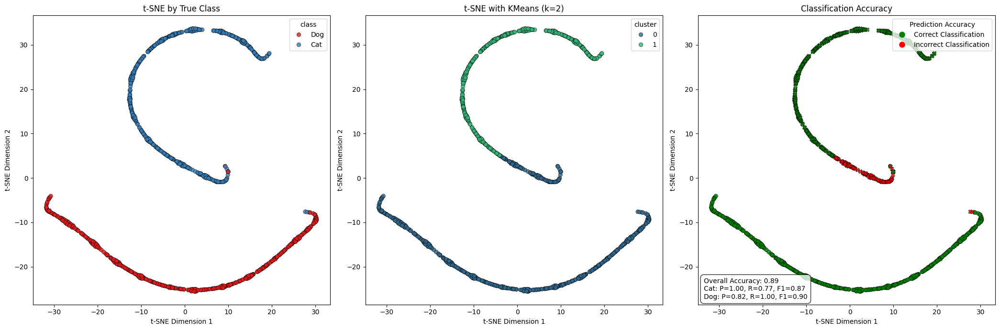

In [29]:
perform_clustering(df_tsne_embeddings_cats_dogs, n_clusters=2)
visualize_clusters(df_tsne_embeddings_cats_dogs)


### Use a finetuned model from better point annotations

/Users/christian/PycharmProjects/hnee/active_learning/active_learning/feature_extraction/timm_feature_extraction.py:29: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.mo

Saved embeddings to embeddings_with_labels_iguanas.csv
Applying t-SNE with perplexity=40...


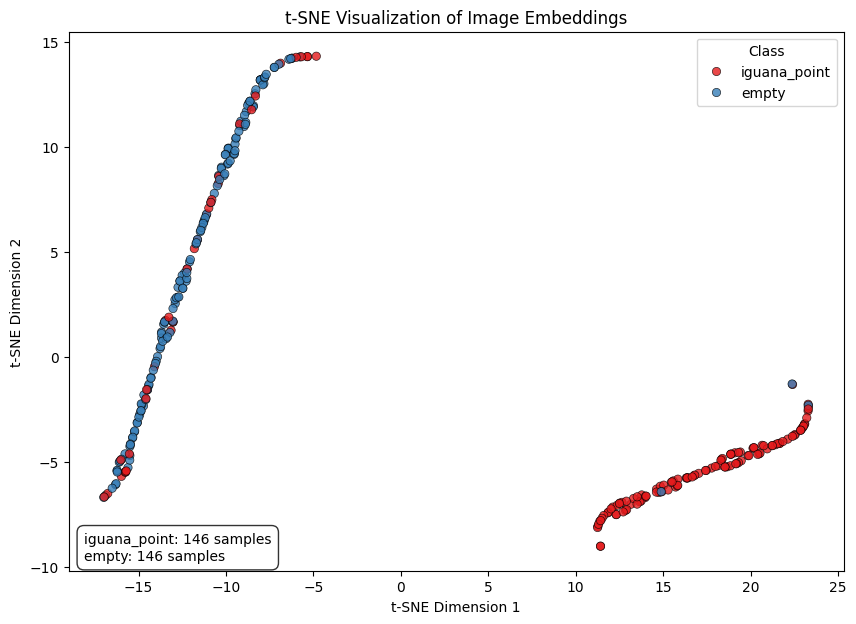

In [30]:
model_path = "/Users/christian/PycharmProjects/hnee/active_learning/active_learning/pipelines/final_model_iguanas_points.pth"
extractor = FeatureExtractor(model_path=model_path)

image_root_dir = Path(
    "/Users/christian/data/training_data/2025_02_22_HIT/03_all_other/val/classification")  # This should contain subfolders (ClassA, ClassB, ...)
embedding_save_path = "embeddings_with_labels_iguanas.csv"

images_list = [i for i in image_root_dir.rglob("*.jpg") if not str(i).startswith(".")]

import random

random.shuffle(images_list)
# create a sample subset
# images_list = images_list[:1000]
class_labels = [x.parent.stem for x in images_list]

extractor.extract_from_image_list(images_list, class_labels=class_labels, save_path=embedding_save_path)
df_tsne_embeddings_iguanas_points = get_tsn_embeddings(embedding_save_path, perplexity=40)

Applying K-means clustering with 2 clusters...


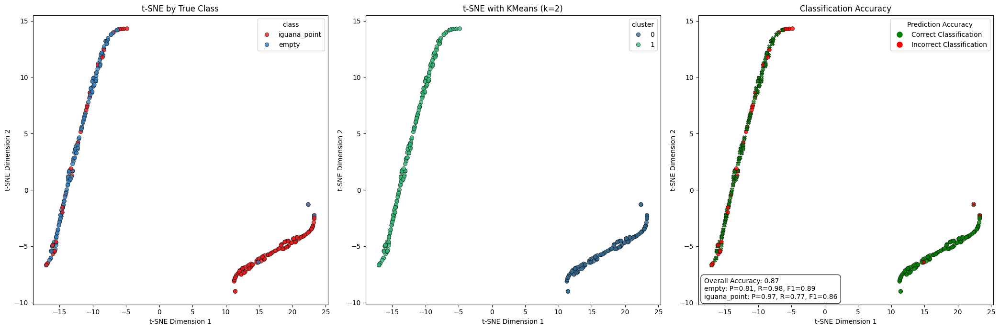

In [31]:
perform_clustering(df_tsne_embeddings_iguanas_points, n_clusters=2)
visualize_clusters(df_tsne_embeddings_iguanas_points)

In [32]:
df_misclassified_iguanas_points = get_misclassified_items(df_tsne_embeddings_iguanas_points)

df_misclassified_iguanas_points

,true_class,predicted_class,cluster,cluster_confidence,X,Y,file_name
9,iguana_point,empty,1,0.807910,-11.632704,5.579168,FMO05___DJI_0148_x2464_y1568.jpg
174,iguana_point,empty,1,0.807910,-5.687741,14.287759,FMO05___DJI_0322_x1568_y1792.jpg
188,iguana_point,empty,1,0.807910,-10.982075,7.090029,FMO05___DJI_0191_x3808_y2464.jpg
215,iguana_point,empty,1,0.807910,-9.224563,11.092118,FMO05___DJI_0322_x1344_y1792.jpg
218,iguana_point,empty,1,0.807910,-10.862836,7.364723,FMO05___DJI_0176_x2912_y0.jpg
229,iguana_point,empty,1,0.807910,-5.987355,14.261142,FMO05___DJI_0322_x1120_y1792.jpg
231,iguana_point,empty,1,0.807910,-12.224887,4.187409,FMO05___DJI_0331_x1792_y2688.jpg
172,iguana_point,empty,1,0.807910,-5.351021,14.295135,FMO05___DJI_0317_x3136_y896.jpg
235,iguana_point,empty,1,0.807910,-16.964876,-6.653963,FMO05___DJI_0331_x2464_y1792.jpg
255,iguana_point,empty,1,0.807910,-14.574873,-1.976623,FMO05___DJI_0176_x4032_y1120.jpg


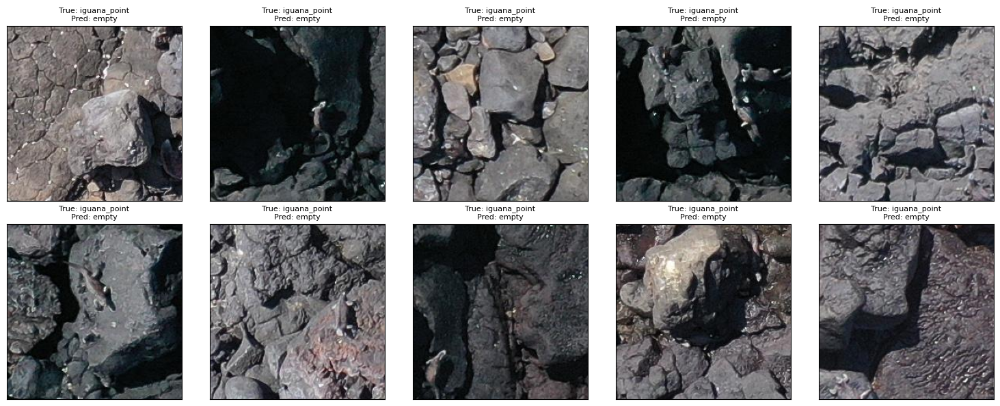

In [33]:
display_misclassified_grid(df_misclassified_iguanas_points[df_misclassified_iguanas_points.true_class == "iguana_point"], image_dir=image_root_dir, cols=5, rows=2, figsize=(15, 6))

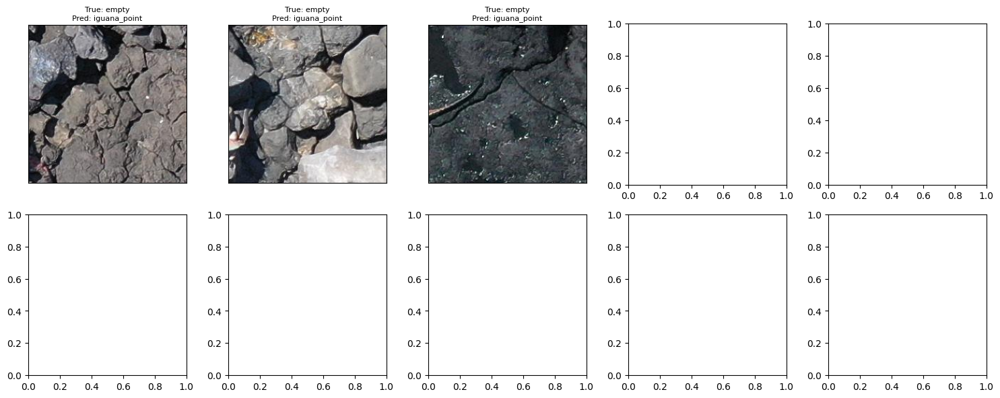

In [34]:
display_misclassified_grid(df_misclassified_iguanas_points[df_misclassified_iguanas_points.true_class == "empty"], image_dir=image_root_dir, cols=5, rows=2, figsize=(15, 6))

# Conclusion

No idea. t-sne makes it look like cats vs dogs is the same as iguanas vs background

SSIM comparison shows